# Evaluate oof
---

In [1]:
# ===============
# libraries
# ===============
import os, gc, yaml, glob, pickle
import time
import random
import math
from pathlib import Path
from typing import Dict, List, Tuple
from types import SimpleNamespace

import numpy as np
import polars as pl
import pandas as pd
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import Image

import warnings
# warnings.filterwarnings('ignore')

# original
import sys
sys.path.append("../src")
from utils.data import sep, show_df, glob_walk, set_seed, save_config_yaml, dict_to_namespace
from utils.metric import global_weighted_r2_score, r2_per_target

from datetime import datetime
date = datetime.now().strftime("%Y%m%d")
print(f"TODAY is {date}")

TODAY is 20251228


In [2]:
# ============================
# set experimental
# ============================
EXP = "100_train_exp000"
fold = 0
# ===============
# Config
# ===============
exp_dir = Path("/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction") / "experiments" / EXP

# config 読み込み
cfg_path = exp_dir / "yaml" / "config.yaml"
if not cfg_path.exists():
    raise FileNotFoundError(f"config.yaml not found: {cfg_path}")

with open(cfg_path, "r") as f:
    cfg = yaml.safe_load(f)

In [3]:
# save_path = exp_dir / f"oof_fold{fold}"
# os.makedirs(save_path, exist_ok=True)

In [4]:
# ================
# load df_folds
# ================
pp_dir = Path(cfg["pp_dir"])
data_ppdir = pp_dir / cfg["preprocess_ver"]
df_pivot = pl.read_csv(data_ppdir / "df_pivot.csv")
sep("df_pivot"); show_df(df_pivot)

df_pivot
(357, 35)


image_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g,date,year,month,day,weekday,weekday_name,is_BarleyGrass,is_Barleygrass,is_Bromegrass,is_Capeweed,is_Clover,is_CrumbWeed,is_Fescue,is_Lucerne,is_Mixed,is_Phalaris,is_Ryegrass,is_SilverGrass,is_SpearGrass,is_SubcloverDalkeith,is_SubcloverLosa,is_WhiteClover,Fold
str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,str,i64,i64,i64,i64,str,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,i64
"""ID1011485656""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,0.0,31.9984,16.2751,48.2735,16.275,"""2015-09-04""",2015,9,4,5,"""Fri""",false,false,false,false,true,false,false,false,false,false,true,false,false,false,false,false,4
"""ID1012260530""","""train/ID1012260530.jpg""","""2015/4/1""","""NSW""","""Lucerne""",0.55,16.0,0.0,0.0,7.6,7.6,7.6,"""2015-04-01""",2015,4,1,3,"""Wed""",false,false,false,false,false,false,false,true,false,false,false,false,false,false,false,false,1
"""ID1025234388""","""train/ID1025234388.jpg""","""2015/9/1""","""WA""","""SubcloverDalkeith""",0.38,1.0,6.05,0.0,0.0,6.05,6.05,"""2015-09-01""",2015,9,1,2,"""Tue""",false,false,false,false,false,false,false,false,false,false,false,false,false,true,false,false,2


In [5]:
# ==========================
# OOF 読み込み
# ==========================
oof_path = exp_dir / "oof" / f"oof_fold{fold}.npz"
if not oof_path.exists():
    raise FileNotFoundError(f"OOF file not found: {oof_path}")

oof = np.load(oof_path)
ids = oof["ids"]        # (N,)
preds = oof["preds"]    # (N,F)
targets = oof["targets"]  # (N,F)
preds_log = oof["preds_log"]  # (N,F)
targs_log = oof["targets_log"]  # (N,F)

target_cols = cfg["target_cols"]

N = len(ids)
if N == 0:
    print(f"[WARN] OOF is empty at {oof_path}")
    
print(f"[INFO] Loaded OOF: {oof_path}")
print(f"[INFO] N samples: {N}")

[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/100_train_exp000/oof/oof_fold0.npz
[INFO] N samples: 61


In [6]:
# compute weighted_r2_score
score = global_weighted_r2_score(targets, preds, cfg["metric"]["weights"])
print(f"[INFO] Weighted R2 Score: {score:.4f}")

[INFO] Weighted R2 Score: -0.1592


In [7]:
pred_df = pl.DataFrame(
    {
        "image_id": ids,
        "preds_Dry_Green_g": preds[:, 0],
        "preds_Dry_Clover_g": preds[:, 1],
        "preds_Dry_Dead_g": preds[:, 2],
        "preds_GDM_g": preds[:, 3],
        "preds_Dry_Total_g": preds[:, 4],
        "targets_Dry_Green_g": targets[:, 0],
        "targets_Dry_Clover_g": targets[:, 1],
        "targets_Dry_Dead_g": targets[:, 2],
        "targets_GDM_g": targets[:, 3],
        "targets_Dry_Total_g": targets[:, 4],
        "preds_log_Dry_Green_g": preds_log[:, 0],
        "preds_log_Dry_Clover_g": preds_log[:, 1],
        "preds_log_Dry_Dead_g": preds_log[:, 2],
        "preds_log_GDM_g": preds_log[:, 3],
        "preds_log_Dry_Total_g": preds_log[:, 4],
        "targets_log_Dry_Green_g": targs_log[:, 0],
        "targets_log_Dry_Clover_g": targs_log[:, 1],
        "targets_log_Dry_Dead_g": targs_log[:, 2],
        "targets_log_GDM_g": targs_log[:, 3],
        "targets_log_Dry_Total_g": targs_log[:, 4],
    }
)
show_df(pred_df)

(61, 21)


image_id,preds_Dry_Green_g,preds_Dry_Clover_g,preds_Dry_Dead_g,preds_GDM_g,preds_Dry_Total_g,targets_Dry_Green_g,targets_Dry_Clover_g,targets_Dry_Dead_g,targets_GDM_g,targets_Dry_Total_g,preds_log_Dry_Green_g,preds_log_Dry_Clover_g,preds_log_Dry_Dead_g,preds_log_GDM_g,preds_log_Dry_Total_g,targets_log_Dry_Green_g,targets_log_Dry_Clover_g,targets_log_Dry_Dead_g,targets_log_GDM_g,targets_log_Dry_Total_g
str,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
"""ID1035947949""",10.005966,1.264565,6.638515,15.619004,22.620367,10.526099,0.4343,23.223902,10.960501,34.184395,2.3984375,0.817383,2.033203,2.810547,3.162109,2.444614,0.360677,3.18734,2.48161,3.560603
"""ID105271783""",25.350424,0.697738,5.83376,33.300373,39.022953,27.666702,5.2698,8.563501,32.936497,41.5,3.271484,0.529297,1.921875,3.535156,3.689453,3.355736,1.835745,2.257954,3.524491,3.749504
"""ID1103883611""",16.213657,0.460686,10.670115,20.090614,33.367432,82.783417,0.0,12.9166,82.783417,95.699989,2.845703,0.378906,2.457031,3.048828,3.537109,4.428235,0.0,2.633082,4.428235,4.571613


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from typing import List

def plot_scatter_grid(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    target_cols: List[str],
    nrows: int = 2,
    ncols: int = 3,
) -> None:
    """ターゲット別散布図（log1p空間）を 2x3 で可視化する。"""
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4), squeeze=False)
    axes_flat = axes.ravel()

    for j, t in enumerate(target_cols):
        ax = axes_flat[j]

        yt = y_true[:, j]
        yp = y_pred[:, j]

        # heavy tail 対策で log1p 空間で可視化
        x = np.log1p(np.clip(yt, 0, None))
        y = np.log1p(np.clip(yp, 0, None))

        ax.scatter(x, y, s=10, alpha=0.6)

        # y=x の線（このsubplot内での範囲に合わせる）
        mn = float(min(x.min(), y.min()))
        mx = float(max(x.max(), y.max()))
        ax.plot([mn, mx], [mn, mx])

        ax.set_title(f"OOF scatter (log1p): {t}")
        ax.set_xlabel("log1p(true)")
        ax.set_ylabel("log1p(pred)")
        ax.grid(True, alpha=0.2)

    # 余った枠を消す（5ターゲットなら最後の1枠）
    for k in range(len(target_cols), nrows * ncols):
        fig.delaxes(axes_flat[k])

    fig.tight_layout()
    plt.show()

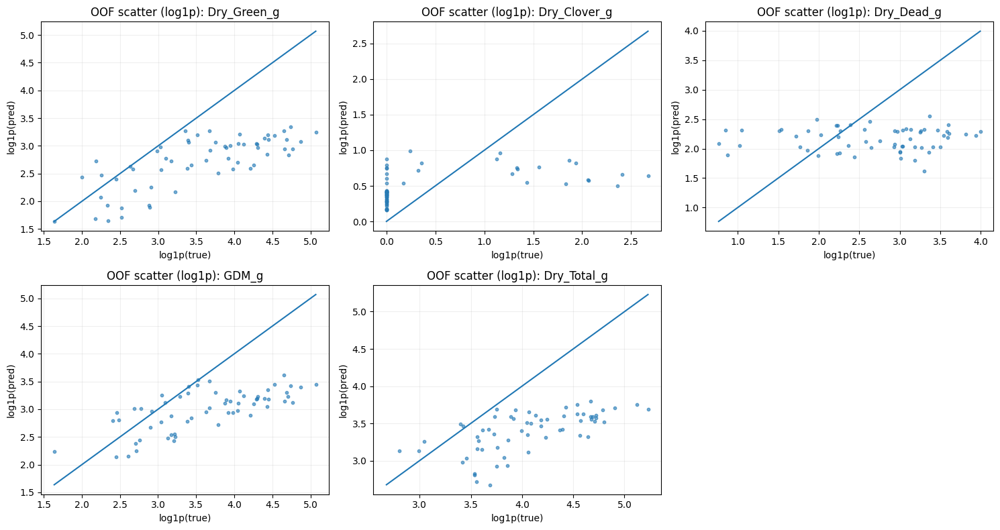

In [9]:
plot_scatter_grid(
    y_true=targets,
    y_pred=preds,
    target_cols=target_cols,
    nrows= 2,
    ncols = 3
    )


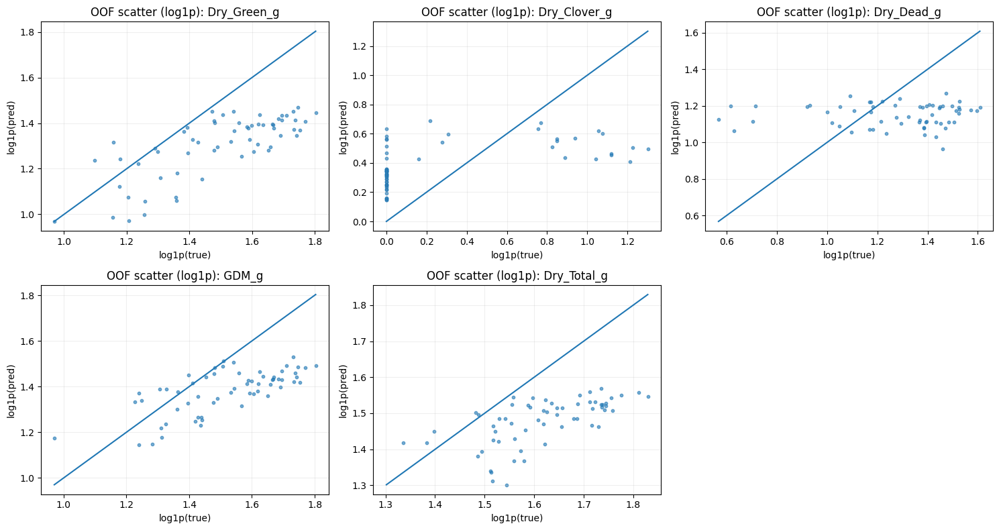

In [10]:
plot_scatter_grid(
    y_true=targs_log,
    y_pred=preds_log,
    target_cols=target_cols,
    nrows= 2,
    ncols = 3
    )


In [11]:
def build_image_score_df(
    ids: np.ndarray,
    targets: np.ndarray,
    preds: np.ndarray,
    weights: List[float],
    df_pivot_pl: pl.DataFrame,
) -> pd.DataFrame:
    """OOFから画像単位の診断スコア（r2_i）を計算してDataFrameにする。

    Notes:
        公式 global weighted R² と整合する平均との差 mu を使い、
        画像ごとの r2_i = 1 - SSE_i/SST_i を計算する（分析用）。

    Returns:
        pd.DataFrame:
            image_id, row_idx, r2_img, sse, sst, image_path, State, Sampling_Date, ...
    """
    weights = np.asarray(weights, dtype=np.float64)
    n = targets.shape[0]
    k = targets.shape[1]

    # 公式globalと整合する weighted mean（単一のmu）
    mu = np.sum(targets * weights[None, :]) / (n * np.sum(weights))

    # 画像ごとの SSE / SST
    sse = np.sum(weights[None, :] * (targets - preds) ** 2, axis=1)
    sst = np.sum(weights[None, :] * (targets - mu) ** 2, axis=1)

    r2_img = np.where(sst > 0, 1.0 - sse / sst, np.nan)

    score_df = pd.DataFrame(
        {
            "image_id": ids.astype(str),
            "row_idx": np.arange(n, dtype=np.int64),
            "r2_img": r2_img.astype(np.float64),
            "sse": sse.astype(np.float64),
            "sst": sst.astype(np.float64),
        }
    )

    # メタ情報（image_pathなど）をjoin
    meta_cols = [c for c in ["image_id", "image_path", "State", "Sampling_Date"] if c in df_pivot_pl.columns]
    meta_pd = df_pivot_pl.select(meta_cols).to_pandas()

    score_df = score_df.merge(meta_pd, on="image_id", how="left")
    score_df["label"] = score_df.apply(lambda r: f"{r['image_id']} | r2={r['r2_img']:.3f}", axis=1)
    return score_df


weights = cfg["metric"]["weights"]
score_df = build_image_score_df(ids, targets, preds, weights, df_pivot)
score_df.sort_values("r2_img", ascending=False).head(10)

,image_id,row_idx,r2_img,sse,sst,image_path,State,Sampling_Date,label
16,ID1512751450,16,0.992363,6.650961,870.884018,train/ID1512751450.jpg,Tas,2015/9/11,ID1512751450 | r2=0.992
56,ID755710743,56,0.987940,16.269435,1349.033252,train/ID755710743.jpg,Tas,2015/9/11,ID755710743 | r2=0.988
1,ID105271783,1,0.987214,6.466401,505.741904,train/ID105271783.jpg,Vic,2015/6/30,ID105271783 | r2=0.987
4,ID1193692654,4,0.984641,19.427071,1264.904773,train/ID1193692654.jpg,Tas,2015/9/11,ID1193692654 | r2=0.985
48,ID656251220,48,0.981392,27.812664,1494.662329,train/ID656251220.jpg,Tas,2015/9/11,ID656251220 | r2=0.981
36,ID353424190,36,0.976555,20.369384,868.805966,train/ID353424190.jpg,NSW,2015/2/25,ID353424190 | r2=0.977
29,ID2037861084,29,0.954529,25.442536,559.536874,train/ID2037861084.jpg,Vic,2015/6/30,ID2037861084 | r2=0.955
28,ID1954669045,28,0.954221,29.407400,642.379370,train/ID1954669045.jpg,Vic,2015/6/30,ID1954669045 | r2=0.954
44,ID560946727,44,0.951827,36.043014,748.202812,train/ID560946727.jpg,Tas,2015/9/11,ID560946727 | r2=0.952
59,ID914754166,59,0.923555,71.058418,929.541785,train/ID914754166.jpg,Vic,2015/10/13,ID914754166 | r2=0.924


In [12]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def plot_image_and_bars_grid(
    subset_df: pd.DataFrame,
    preds: np.ndarray,
    targets: np.ndarray,
    target_cols: List[str],
    input_dir: str,
    title_prefix: str,
    use_log1p_y: bool = False,
) -> None:
    """Nx2（左=画像、右=target/pred棒グラフ）で可視化する。

    Args:
        subset_df: score_df の部分集合（row_idx を含む必要あり）
        preds, targets: (N,K)
        target_cols: ターゲット名（K個）
        input_dir: raw データroot（画像パスのroot）
        title_prefix: "TOP" / "WORST" など
        use_log1p_y: 棒グラフのyをlog1pで描く（スケール差が大きいときに便利）
    """
    n = len(subset_df)
    if n == 0:
        print("[WARN] subset_df is empty.")
        return

    fig, axes = plt.subplots(n, 2, figsize=(14, 4 * n), squeeze=False)

    x = np.arange(len(target_cols))
    width = 0.35

    for i, row in enumerate(subset_df.itertuples(index=False)):
        idx = int(row.row_idx)
        image_id = str(row.image_id)
        r2_img = float(row.r2_img)
        sse = float(row.sse)

        # --- 左: 画像 ---
        ax_img = axes[i, 0]
        img_path = Path(input_dir) / str(row.image_path)
        img = Image.open(img_path).convert("RGB")
        ax_img.imshow(img)
        ax_img.axis("off")
        ax_img.set_title(f"{title_prefix}{i+1}: {image_id} | r2={r2_img:.3f}")

        # --- 右: 棒グラフ ---
        ax_bar = axes[i, 1]
        y_true = targets[idx].copy()
        y_pred = preds[idx].copy()

        # 見やすさのため、任意でlog1pに変換
        if use_log1p_y:
            y_true_plot = np.log1p(np.clip(y_true, 0, None))
            y_pred_plot = np.log1p(np.clip(y_pred, 0, None))
            ax_bar.set_ylabel("log1p(g)")
        else:
            y_true_plot = y_true
            y_pred_plot = y_pred
            ax_bar.set_ylabel("g")

        ax_bar.bar(x - width / 2, y_true_plot, width, label="target")
        ax_bar.bar(x + width / 2, y_pred_plot, width, label="pred")

        ax_bar.set_xticks(x)
        ax_bar.set_xticklabels(target_cols, rotation=45, ha="right")
        ax_bar.grid(True, axis="y", alpha=0.25)
        ax_bar.legend()

        # SSEも軽く表示（診断用）
        ax_bar.set_title(f"SSE(w)={sse:.2f}")

    fig.tight_layout()
    plt.show()

In [13]:
TOP_N = 8
WORST_N = 8

rank_df = score_df.dropna(subset=["r2_img"]).sort_values("r2_img", ascending=False)

top_df = rank_df.head(TOP_N)
worst_df = rank_df.sort_values("r2_img", ascending=True).head(WORST_N)

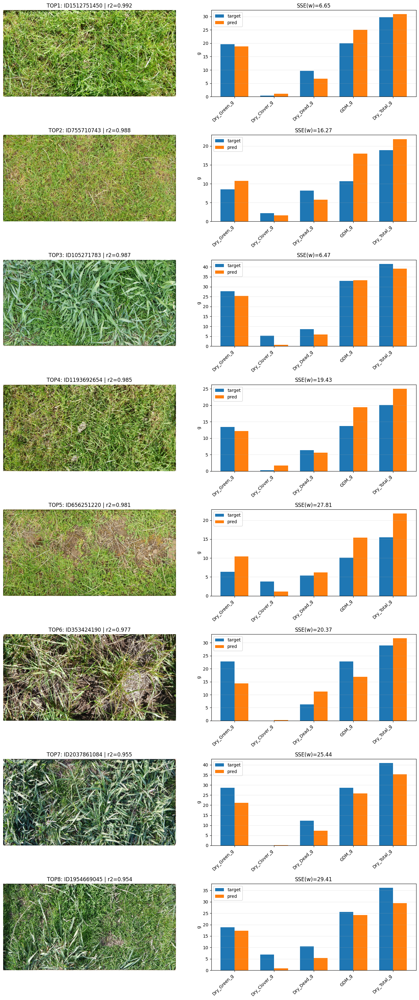

In [14]:
plot_image_and_bars_grid(
    subset_df=top_df,
    preds=preds,
    targets=targets,
    target_cols=target_cols,
    input_dir=cfg["input_dir"],
    title_prefix="TOP",
    use_log1p_y=False,   # Trueにするとスケール差が見やすい
)

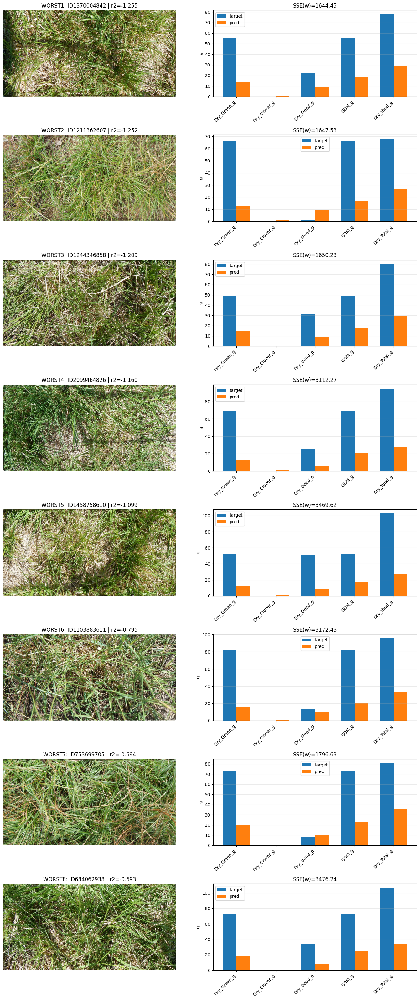

In [15]:
plot_image_and_bars_grid(
    subset_df=worst_df,
    preds=preds,
    targets=targets,
    target_cols=target_cols,
    input_dir=cfg["input_dir"],
    title_prefix="WORST",
    use_log1p_y=False,
)